<a href="https://colab.research.google.com/github/Ritikj55/Crack-Detection-Dataset/blob/main/Crack_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torch.optim import lr_scheduler
from torchvision import datasets, models, transforms
import torchvision
import numpy as np
import os
cwd = os.getcwd()
from PIL import Image
import time
import copy
import random
import cv2
import re
import shutil

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [ ]:
!pip install unrar

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
! wget https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/5y9wdsg2zt-2.zip

--2021-03-05 03:57:35--  https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/5y9wdsg2zt-2.zip
Resolving md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com (md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com)... 52.218.90.56
Connecting to md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com (md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com)|52.218.90.56|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 240847944 (230M) [application/octet-stream]
Saving to: ‘5y9wdsg2zt-2.zip’

5y9wdsg2zt-2.zip    100%[===================>] 229.69M  34.3MB/s    in 7.2s    

2021-03-05 03:57:43 (31.8 MB/s) - ‘5y9wdsg2zt-2.zip’ saved [240847944/240847944]



In [ ]:

!unzip 5y9wdsg2zt-2

Archive:  5y9wdsg2zt-2.zip
  inflating: Concrete Crack Images for Classification.rar  


In [ ]:
!unrar x Concrete_Crack_Images_for_Classification

Streaming output truncated to the last 5000 lines.
Extracting  Negative/15002.jpg                                            88%  OK 
Extracting  Negative/15003.jpg                                            88%  OK 
Extracting  Negative/15004.jpg                                            88%  OK 
Extracting  Negative/15005.jpg                                            88%  OK 
Extracting  Negative/15006.jpg                                            88%  OK 
Extracting  Negative/15007.jpg                                            88%  OK 
Extracting  Negative/15008.jpg                                            88%  OK 
Extracting  Negative/15009.jpg                                            88%  OK 
Extracting  Negative/15010.jpg                                            88%  OK 
Extracting  Negative/15011.jpg                                            88%  OK 
Extracting  Negative/15012.jp

In [ ]:
k=os.listdir('/content/Negative')
len(k)

20000

In [ ]:
if  os.path.exists('/content/Positive'):
  crack_images_positive = os.listdir('/content/Positive')
  print("Number of Crack Images: ", len(crack_images_positive))

Number of Crack Images:  20000


In [ ]:
if  os.path.exists('/content/Negative'):
  crack_images_negative = os.listdir('/content/Negative')
  print("Number of Crack Images: ",len(crack_images_negative))

Number of Crack Images:  20000


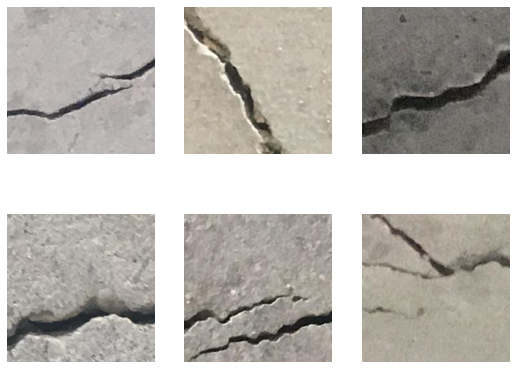

In [ ]:
random_indeces = np.random.randint(0,len(crack_images_positive),size=6)
random_array = np.array(crack_images_positive)[random_indeces.astype(int)]
f,axx = plt.subplots(2,3,figsize=(9,7))
#plt.axis('off')
c=0
for i in range (2):
    for j in range(3):
        axx[i,j].imshow(mpimg.imread(os.path.join('/content/Positive',random_array[c])))
        axx[i,j].axis('off')
        c=c+1

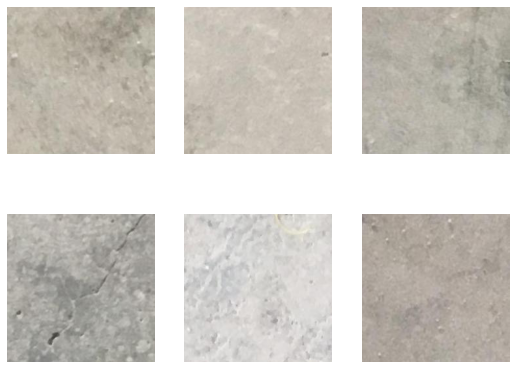

In [ ]:
random_indeces = np.random.randint(0,len(crack_images_positive),size=6)
random_array = np.array(crack_images_negative)[random_indeces.astype(int)]
f,axx = plt.subplots(2,3,figsize=(9,7))
#plt.axis('off')
c=0
for i in range (2):
    for j in range(3):
        axx[i,j].imshow(mpimg.imread(os.path.join('/content/Negative',random_array[c])))
        axx[i,j].axis('off')
        c=c+1

In [ ]:
os.listdir('/content/drive/MyDrive/Colab Notebooks')

['Crack_detection.ipynb', 'concrete-cracks-1.jpg']

In [ ]:
files = os.listdir('/content')
def create_training_data(folder_name):
     train_dir = f"/content/train/{folder_name}"
   
     for f in files:  
        search_file=re.search(folder_name,f)
        if search_file:
            shutil.move(f'/content/{folder_name}',train_dir)

In [ ]:
k=os.listdir('/content/Positive')
print(len(k))

20000


In [ ]:
if not os.path.exists('/content/train/Positive'):
 create_training_data('Positive')
 create_training_data('Negative')

In [ ]:
k=os.listdir('/content/train/Positive')
print(len(k))

20000


In [ ]:
if not os.path.exists('/content/val/Positive'):
     os.makedirs('/content//val/Positive')
     os.makedirs('/content/val/Negative')

In [ ]:
k=os.listdir('/content/val/Positive')
l=len(k)

In [ ]:
base_dir = '/content'
positive_train = base_dir + "/train/Positive/"
positive_val = base_dir + "/val/Positive/"
negative_train = base_dir + "/train/Negative/"
negative_val = base_dir + "/val/Negative/"

positive_files = os.listdir(positive_train)
negative_files = os.listdir(negative_train)

In [ ]:
 if l == 0 :  
   for f in positive_files:
        if random.random() > 0.85:
            shutil.move(f'{positive_train}/{f}', positive_val)

In [ ]:
if l == 0 :
    for f in negative_files :
        if random.random() > 0.85 :
            shutil.move(f'{negative_train}/{f}',negative_val)

In [ ]:
k=os.listdir('/content/val/Positive')
print(len(k))

2987


In [ ]:
mean_nums=[0.485,0.456,0.406]
std_nums = [0.229,0.224,0.225]

In [ ]:
chosen_transforms = {'train': transforms.Compose([
                    transforms.RandomResizedCrop(size=227),
                    transforms.RandomRotation(degrees=10),
                    transforms.RandomHorizontalFlip(),
                    transforms.RandomVerticalFlip(),
                    transforms.ColorJitter(brightness=0.15,contrast=0.15),
                    transforms.ToTensor(),
                    transforms.Normalize(mean_nums,std_nums)
                    ]),
                    
                    'val': transforms.Compose([
                           transforms.Resize(227),
                           transforms.CenterCrop(227),
                           transforms.ToTensor(),
                           transforms.Normalize(mean_nums,std_nums)])
                   }
        

In [ ]:
def Load_dataset(format,batch_size):

    data_path = os.path.join(cwd,format)
    dataset = datasets.ImageFolder(
        root=data_path,
        transform = chosen_transforms[format]
    )
    data_loader = DataLoader(
     dataset,
     batch_size= batch_size,
        num_workers=4,
        shuffle=True
     )
    
    
    return data_loader,len(dataset),dataset.classes


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available()  else "cpu")
print(device)

cuda


In [ ]:
train_loader,train_size,class_names = Load_dataset('train',8)
print("Training dataset size  : ",train_size)
print("Class name  are :",class_names)
inputs,classes = next(iter(train_loader))
print(inputs.shape,classes.shape)

Training dataset size  :  33881
Class name  are : ['Negative', 'Positive']
torch.Size([8, 3, 227, 227]) torch.Size([8])


In [ ]:
 # Visualize some images
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([mean_nums])
    std = np.array([std_nums])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # Pause a bit so that plots are updated

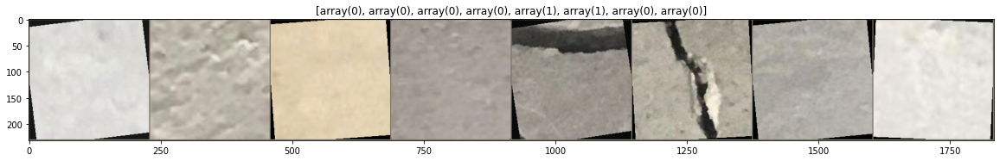

In [ ]:
inputs,classes = next(iter(train_loader))
out =  torchvision.utils.make_grid(inputs)
idx_to_class = {0:'Negative',1:'Positive'}
plt.figure(figsize =(20,20))
imshow(out,title = [x.data.numpy() for x in classes ])

In [ ]:

# Load pretrained model
resnet50 = models.resnet50(pretrained=True)

# Freeze model parameters
for param in resnet50.parameters():
    param.requires_grad = False

## Change the final layer of the resnet model
# Change the final layer of ResNet50 Model for Transfer Learning
fc_inputs = resnet50.fc.in_features
 
resnet50.fc = nn.Sequential(
    nn.Linear(fc_inputs, 128),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(128, 2)
)

# Convert model to be used on GPU
resnet50 = resnet50.to(device)

from torchsummary import summary
print(summary(resnet50, (3, 227, 227)))

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 114, 114]           9,408
       BatchNorm2d-2         [-1, 64, 114, 114]             128
              ReLU-3         [-1, 64, 114, 114]               0
         MaxPool2d-4           [-1, 64, 57, 57]               0
            Conv2d-5           [-1, 64, 57, 57]           4,096
       BatchNorm2d-6           [-1, 64, 57, 57]             128
              ReLU-7           [-1, 64, 57, 57]               0
            Conv2d-8           [-1, 64, 57, 57]          36,864
       BatchNorm2d-9           [-1, 64, 57, 57]             128
             ReLU-10           [-1, 64, 57, 57]               0
           Conv2d-11          [-1, 256, 57, 57]          16,384
      BatchNorm2d-12          [-1, 256, 57, 57]             512
           Conv2d-13          [-1, 256, 57, 57]          16,384
      BatchNorm2d-14          [-1, 256

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet50.parameters())
# Decay LR by a factor of 0.1 every 3 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1 )

In [ ]:
dataloaders = {}
dataset_sizes = {}
batch_size = 256
dataloaders['train'],dataset_sizes['train'],class_names = Load_dataset('train',batch_size)
dataloaders['val'],dataset_sizes['val'],class_names = Load_dataset('val',batch_size)
idx_to_class = {0:'Negative',1:'Positive'}

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=10):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            current_loss = 0.0
            current_corrects = 0

            # Here's where the training happens
            print('Iterating through data...')

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # We need to zero the gradients, don't forget it
                optimizer.zero_grad()

                # Time to carry out the forward training poss
                # We only need to log the loss stats if we are in training phase
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        

                # We want variables to hold the loss statistics
                current_loss += loss.item() * inputs.size(0)
                current_corrects += torch.sum(preds == labels.data)

            epoch_loss = current_loss / dataset_sizes[phase]
            epoch_acc = current_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # Make a copy of the model if the accuracy on the validation set has improved
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_since = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_since // 60, time_since % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # Now we'll load in the best model weights and return it
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
def Visualize_Model(model,num_images=6):
    was_training = model.training
    model.eval()
    images_handled=0
    fig = plt.figure()
    with  torch.no_grad():
        for i,(inputs,labels) in enumerate (dataloaders['val']):
         
            inputs=inputs.to(device)
            labels=labels.to(device)
            
            
            
            
            outputs =model(inputs)
            _,preds=torch.max(outputs,1)
            for j in range (inputs.size()[0]):
                images_handled = +1
                ax = plt.subplot(num_images//2,2,images_handled)
                ax.axis('off')
                ax.set_title('predicted : {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])
                
                if images_handled == num_images :
                    model.train(model=was_training)
                    return 
                    
        model.train(mode=was_training)               
        

In [ ]:
base_model = train_model(resnet50,criterion,optimizer,exp_lr_scheduler,num_epochs=10)
Visualize_Model(base_model)
plt.show()


Epoch 0/9
----------
Iterating through data...
train Loss: 0.1682 Acc: 0.9362
Iterating through data...
val Loss: 0.0524 Acc: 0.9848

Epoch 1/9
----------
Iterating through data...
train Loss: 0.1595 Acc: 0.9413
Iterating through data...
val Loss: 0.0515 Acc: 0.9853

Epoch 2/9
----------
Iterating through data...
train Loss: 0.1585 Acc: 0.9401
Iterating through data...
val Loss: 0.0487 Acc: 0.9868

Epoch 3/9
----------
Iterating through data...
train Loss: 0.1627 Acc: 0.9378
Iterating through data...
val Loss: 0.0472 Acc: 0.9868

Epoch 4/9
----------
Iterating through data...
train Loss: 0.1581 Acc: 0.9397
Iterating through data...
val Loss: 0.0469 Acc: 0.9876

Epoch 5/9
----------
Iterating through data...
train Loss: 0.1608 Acc: 0.9386
Iterating through data...
val Loss: 0.0479 Acc: 0.9873

Epoch 6/9
----------
Iterating through data...
train Loss: 0.1586 Acc: 0.9405
Iterating through data...
val Loss: 0.0467 Acc: 0.9877

Epoch 7/9
----------
Iterating through data...
train Loss: 0.1

NameError: ignored

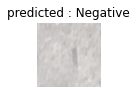

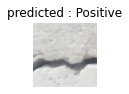

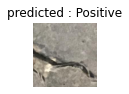

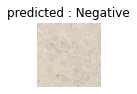

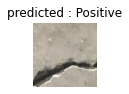

...

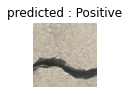

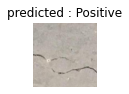

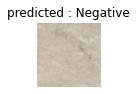

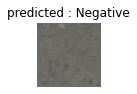

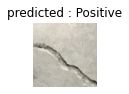

KeyboardInterrupt: ignored

In [ ]:
Visualize_Model(base_model)
plt.show()

In [ ]:
print("Saving the Data ")
torch.save(base_model,'crack_detection.pt')

Saving the Data 


In [ ]:
def predict(model, test_image, print_class = False):
     
    transform = chosen_transforms['val']
     
    test_image_tensor = transform(test_image)
 
    if torch.cuda.is_available():
        test_image_tensor = test_image_tensor.view(1, 3, 227, 227).cuda()
    else:
        test_image_tensor = test_image_tensor.view(1, 3, 227, 227)
     
    with torch.no_grad():
        model.eval()
        # Model outputs log probabilities
        out = model(test_image_tensor)
        ps = torch.exp(out)
        topk, topclass = ps.topk(1, dim=1)
        class_name = idx_to_class[topclass.cpu().numpy()[0][0]]
        if print_class:
            print("Output class :  ", class_name)
    return class_name

    


In [ ]:
def predict_on_crops(input_image, height=227, width=227, save_crops = False):
    im = cv2.imread(input_image)
    imgheight, imgwidth, channels = im.shape
    k=0
    output_image = np.zeros_like(im)
    for i in range(0,imgheight,height):
        for j in range(0,imgwidth,width):
            a = im[i:i+height, j:j+width]
            ## discard image cropss that are not full size
            predicted_class = predict(base_model,Image.fromarray(a))
            ## save image
            file, ext = os.path.splitext(input_image)
            image_name = file.split('/')[-1]
            folder_name = 'out_' + image_name
            ## Put predicted class on the image
            if predicted_class == 'Positive':
                color = (0,0, 255)
            else:
                color = (0, 255, 0)
            cv2.putText(a, predicted_class, (50,50), cv2.FONT_HERSHEY_SIMPLEX , 0.7, color, 1, cv2.LINE_AA) 
            b = np.zeros_like(a, dtype=np.uint8)
            b[:] = color
            add_img = cv2.addWeighted(a, 0.9, b, 0.1, 0)
            ## Save crops
            if save_crops:
                if not os.path.exists(os.path.join('real_images', folder_name)):
                    os.makedirs(os.path.join('real_images', folder_name))
                filename = os.path.join('real_images', folder_name,'img_{}.png'.format(k))
                cv2.imwrite(filename, add_img)
            output_image[i:i+height, j:j+width,:] = add_img
            k+=1
    ## Save output image
    cv2.imwrite(os.path.join('real_images','predictions', folder_name+ '.jpg'), output_image)
    return output_image

                
            

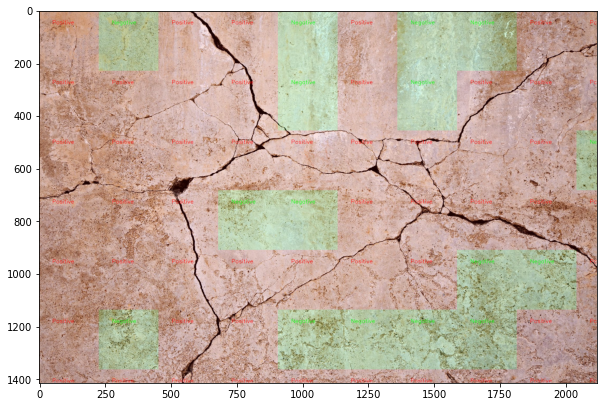

In [ ]:
plt.figure(figsize=(10,10))
output_image = predict_on_crops('/content/drive/MyDrive/Colab Notebooks/concrete-cracks-1.jpg')
plt.imshow(cv2.cvtColor(output_image,cv2.COLOR_BGR2RGB))

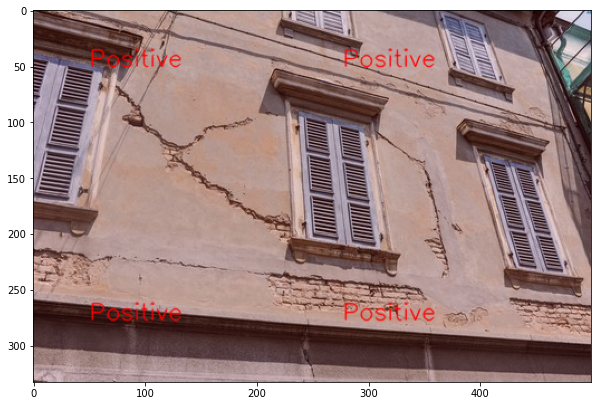

In [ ]:
plt.figure(figsize=(10,10))
output_image = predict_on_crops('/content/drive/MyDrive/crack2.jpg')
plt.imshow(cv2.cvtColor(output_image,cv2.COLOR_BGR2RGB))

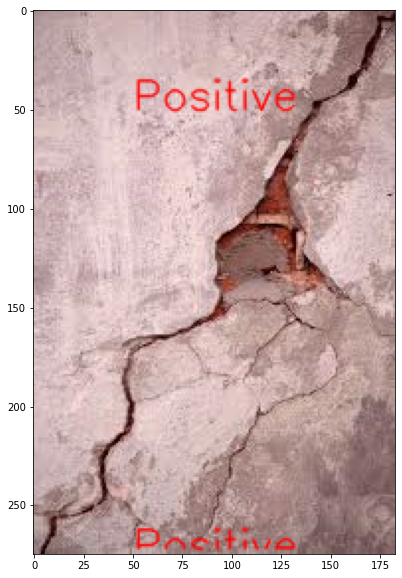

In [ ]:
plt.figure(figsize=(10,10))
output_image = predict_on_crops('/content/drive/MyDrive/crack3.jpg')
plt.imshow(cv2.cvtColor(output_image,cv2.COLOR_BGR2RGB))

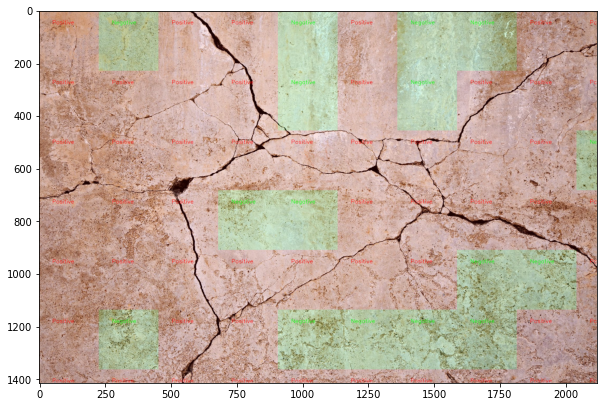

In [ ]:
plt.figure(figsize=(10,10))
output_image = predict_on_crops('/content/drive/MyDrive/Colab Notebooks/concrete-cracks-1.jpg')
plt.imshow(cv2.cvtColor(output_image,cv2.COLOR_BGR2RGB))